In [3]:
# Imports
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import numpy as np
from sklearn.cluster import KMeans
import os, shutil, glob, os.path
from PIL import Image as pil_image
image.LOAD_TRUNCATED_IMAGES = True 
model = VGG16(weights='imagenet', include_top=False)

# Variables
imdir = './data/monet2photo/trainA' # DIR containing images
targetdir = "./outdir" # DIR to copy clustered images to
number_clusters = 10

# Loop over files and get features
filelist = glob.glob(os.path.join(imdir, '*.jpg'))
filelist.sort()
featurelist = []
for i, imagepath in enumerate(filelist):
    try:
        print("    Status: %s / %s" %(i, len(filelist)), end="\r")
        img = image.load_img(imagepath, target_size=(224, 224))
        img_data = image.img_to_array(img)
        img_data = np.expand_dims(img_data, axis=0)
        img_data = preprocess_input(img_data)
        features = np.array(model.predict(img_data))
        featurelist.append(features.flatten())
    except:
        continue

# Clustering
kmeans = KMeans(n_clusters=number_clusters, random_state=0).fit(np.array(featurelist))

# Copy images renamed by cluster 
# Check if target dir exists
try:
    os.makedirs(targetdir)
except OSError:
    pass
# Copy with cluster name
print("\n")
for i, m in enumerate(kmeans.labels_):
    try:
        print("    Copy: %s / %s" %(i, len(kmeans.labels_)), end="\r")
        shutil.copy(filelist[i], targetdir + str(m) + "_" + str(i) + ".jpg")
    except:
        continue

    Status: 1071 / 1072



In [4]:
import collections

collections.Counter(kmeans.labels_)

Counter({9: 404, 4: 296, 7: 1, 0: 159, 3: 81, 8: 99, 1: 28, 2: 1, 5: 2, 6: 1})

In [9]:
indices0 = [i for i, x in enumerate(kmeans.labels_) if x == 0]
indices1 = [i for i, x in enumerate(kmeans.labels_) if x == 1]
indices2 = [i for i, x in enumerate(kmeans.labels_) if x == 2]
indices3 = [i for i, x in enumerate(kmeans.labels_) if x == 3]
indices4 = [i for i, x in enumerate(kmeans.labels_) if x == 4]
indices5 = [i for i, x in enumerate(kmeans.labels_) if x == 5]
indices6 = [i for i, x in enumerate(kmeans.labels_) if x == 6]
indices9 = [i for i, x in enumerate(kmeans.labels_) if x == 9]

In [11]:
import cv2
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 

Populating the interactive namespace from numpy and matplotlib


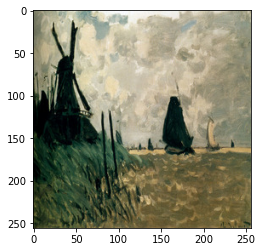

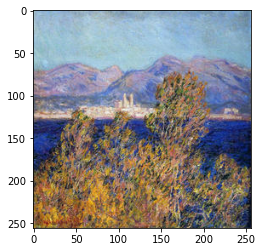

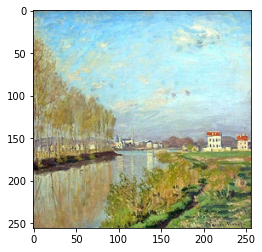

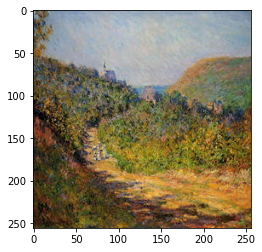

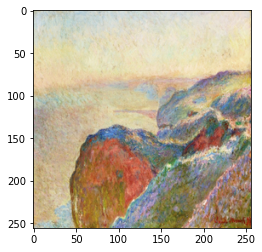

...

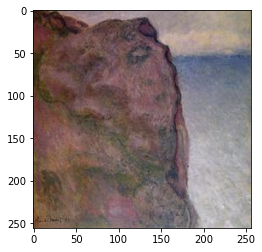

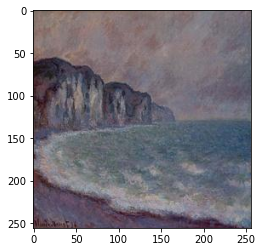

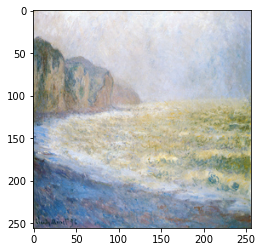

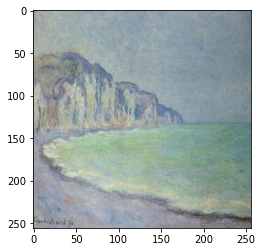

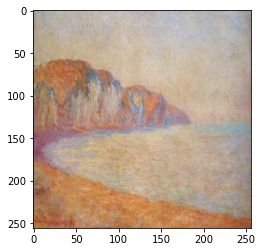

In [24]:
for i in range(0,30):
    imgplot = plt.imshow(cv2.imread(filelist[indices4[i]])[:,:,::-1])
    plt.show()

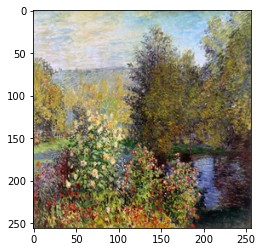

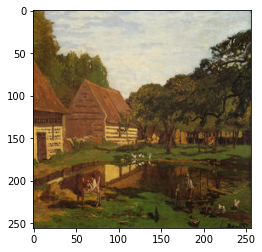

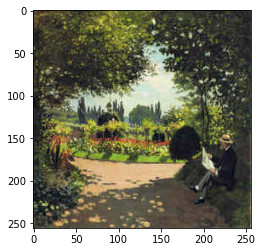

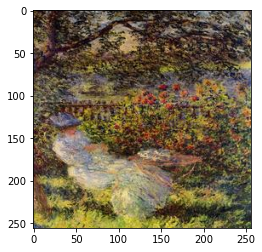

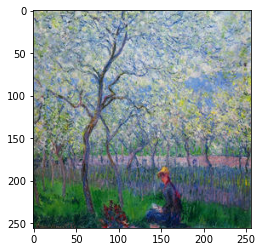

...

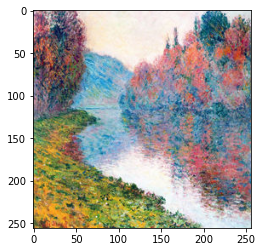

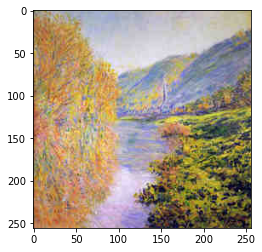

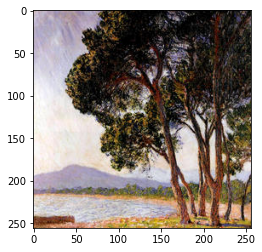

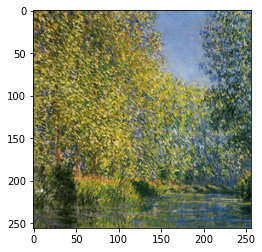

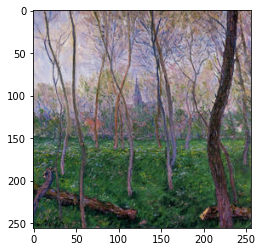

In [25]:
for i in range(0,30):
    imgplot = plt.imshow(cv2.imread(filelist[indices9[i]])[:,:,::-1])
    plt.show()

In [27]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(np.array(featurelist))
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show() 

KeyboardInterrupt: 

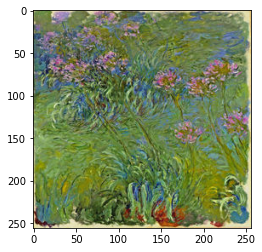

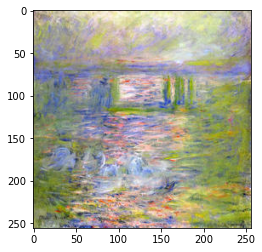

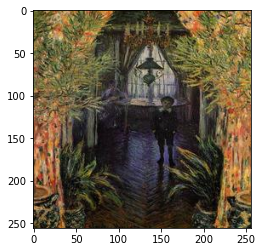

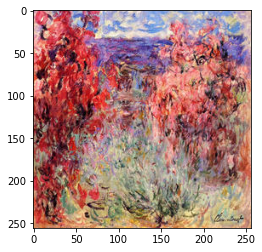

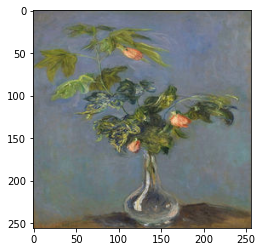

...

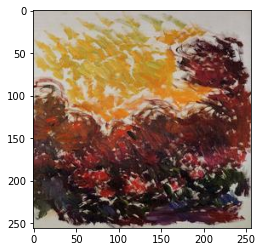

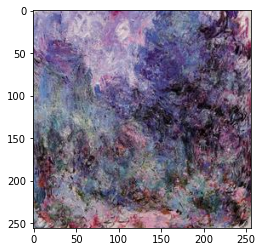

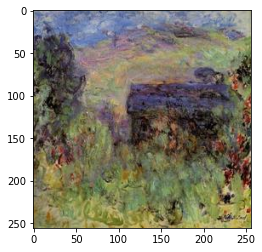

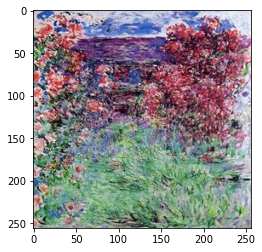

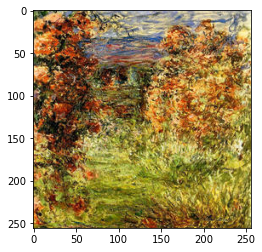

In [28]:
for i in range(0,30):
    imgplot = plt.imshow(cv2.imread(filelist[indices0[i]])[:,:,::-1])
    plt.show()

In [34]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     